# <span style='background :yellow' > Exercise 6.3 </span>

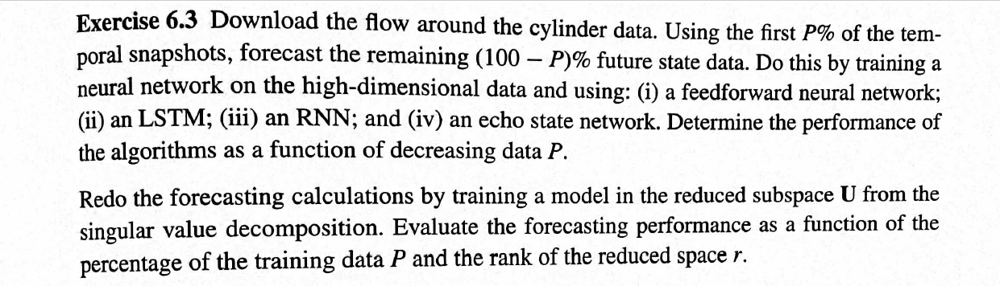

## Load the cylinder flow data set .

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy.io
import scipy.misc
from matplotlib import rcParams
from scipy import io
import os
from sklearn import linear_model
import matplotlib.cm as cm

import tensorflow as tf
from tensorflow import keras

rcParams.update({'font.size': 18})
plt.rcParams['figure.figsize'] = [12, 12]

mat_contents = scipy.io.loadmat(os.path.join('VORTALL'))
X=mat_contents['VORTALL']

In [2]:
import imageio

def plotFlow(X):    
    ## Plot Mode 2
    vortmin = -5
    vortmax = 5
    V2 = np.copy(np.real(np.reshape(X,(449,199))))
    V2 = V2.T

    # normalize values... not symmetric
    minval = np.min(V2)
    maxval = np.max(V2)

    if np.abs(minval) < 5 and np.abs(maxval) < 5:
        if np.abs(minval) > np.abs(maxval):
            vortmax = maxval
            vortmin = -maxval
        else:
            vortmin = minval
            vortmax = -minval

    V2[V2 > vortmax] = vortmax
    V2[V2 < vortmin] = vortmin

    plt.imshow(V2,cmap='jet',vmin=vortmin,vmax=vortmax)

    cvals = np.array([-4,-2,-1,-0.5,-0.25,-0.155])
    plt.contour(V2,cvals*vortmax/5,colors='k',linestyles='dashed',linewidths=1)
    plt.contour(V2,np.flip(-cvals)*vortmax/5,colors='k',linestyles='solid',linewidths=0.4)

    plt.scatter(49,99,5000,color='k') # draw cylinder


def createMovie(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(151):
        plotFlow(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)

In [3]:
## Plot the original movie of the flow field
createMovie(X)

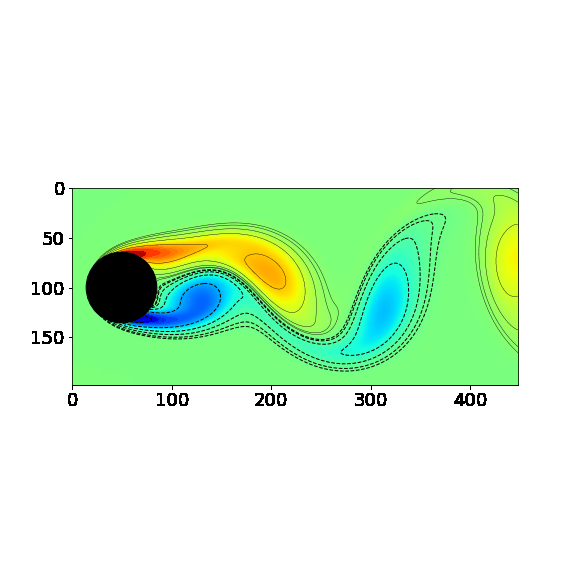

In [65]:
def createMovie_train(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(0,91):
        plotFlow(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices_train.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)
        
def createMovie_test(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(90,150):
        plotFlow(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices_test.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)
        
def createMovie_pred(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(0,60):
        plotFlow(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices_pred.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)
        
def createMovie_pred_rnn(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(0,20):
        plotFlow(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices_pred_rnn.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)

In [5]:
# Plot the training movies 
createMovie_train(X)

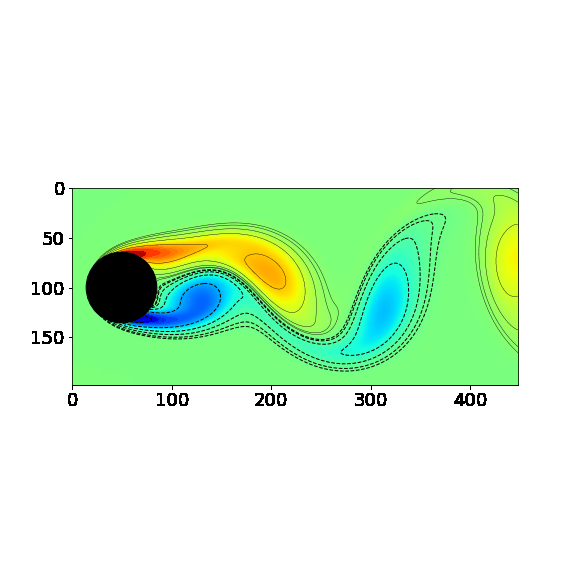

In [6]:
# Plot the test movies 
createMovie_test(X)

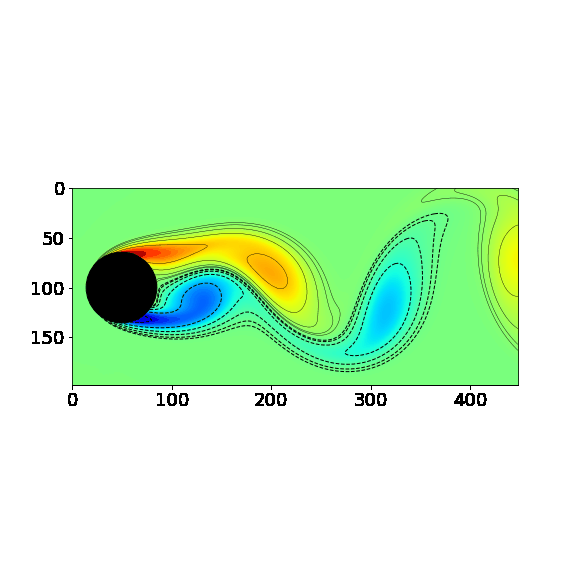

# (i) A feedforward neural network

In [8]:
nn_input=np.zeros((X.shape[0],90))
nn_output=np.zeros((X.shape[0],90))
nn_input_test=np.zeros((X.shape[0],60))
nn_output_test=np.zeros((X.shape[0],60))
for j in range(90):
    nn_input[:,j]= X[:,j]
    nn_output[:,j]= X[:,j+1]
    
for k in range(0,60):
    nn_input_test[:,k]= X[:,60+k]
    nn_output_test[:,k]= X[:,60+k+1] 
    
X_train=nn_input.T
y_train=nn_output.T
X_test=nn_input_test.T
y_test=nn_output_test.T

In [9]:
model = keras.models.Sequential([
        #keras.layers.Flatten(input_shape=[32, 32]),
        keras.layers.Dense(1000, input_dim=X.shape[0],activation="relu"),
        keras.layers.Dense(500, activation="relu"),
        keras.layers.Dense(100, activation="relu"),
        keras.layers.Dense(100, activation="relu"),
        keras.layers.Dense(100, activation="relu"),
        keras.layers.Dense(X.shape[0], activation="linear")
])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1000)              89352000  
_________________________________________________________________
dense_1 (Dense)              (None, 500)               500500    
_________________________________________________________________
dense_2 (Dense)              (None, 100)               50100     
_________________________________________________________________
dense_3 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_4 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_5 (Dense)              (None, 89351)             9024451   
Total params: 98,947,251
Trainable params: 98,947,251
Non-trainable params: 0
____________________________________________

In [10]:
model.compile(loss="mse", optimizer="adam")

In [11]:
history = model.fit(X_train, y_train, epochs=100,validation_data=(X_test, y_test)) 

Epoch 1/100
3/3 [==============================] - 4s 1s/step - loss: 1.2190 - val_loss: 0.9726
Epoch 2/100
3/3 [==============================] - 2s 833ms/step - loss: 0.8975 - val_loss: 0.5605
Epoch 3/100
3/3 [==============================] - 2s 803ms/step - loss: 0.5137 - val_loss: 0.3145
Epoch 4/100
3/3 [==============================] - 2s 805ms/step - loss: 0.2921 - val_loss: 0.2037
Epoch 5/100
3/3 [==============================] - 2s 805ms/step - loss: 0.1897 - val_loss: 0.1444
Epoch 6/100
3/3 [==============================] - 2s 816ms/step - loss: 0.1336 - val_loss: 0.1022
Epoch 7/100
3/3 [==============================] - 2s 800ms/step - loss: 0.0988 - val_loss: 0.0763
Epoch 8/100
3/3 [==============================] - 2s 786ms/step - loss: 0.0720 - val_loss: 0.0572
Epoch 9/100
3/3 [==============================] - 2s 791ms/step - loss: 0.0554 - val_loss: 0.0423
Epoch 10/100
3/3 [==============================] - 2s 829ms/step - loss: 0.0418 - val_loss: 0.0355
Epoch 11/100

Epoch 83/100
3/3 [==============================] - 2s 813ms/step - loss: 6.9730e-04 - val_loss: 5.9024e-04
Epoch 84/100
3/3 [==============================] - 2s 826ms/step - loss: 6.4385e-04 - val_loss: 6.0114e-04
Epoch 85/100
3/3 [==============================] - 3s 1s/step - loss: 6.4818e-04 - val_loss: 9.4126e-04
Epoch 86/100
3/3 [==============================] - 5s 1s/step - loss: 8.7062e-04 - val_loss: 7.3475e-04
Epoch 87/100
3/3 [==============================] - 2s 845ms/step - loss: 7.7541e-04 - val_loss: 0.0011
Epoch 88/100
3/3 [==============================] - 2s 823ms/step - loss: 0.0012 - val_loss: 0.0014
Epoch 89/100
3/3 [==============================] - 3s 1s/step - loss: 0.0011 - val_loss: 0.0015
Epoch 90/100
3/3 [==============================] - 3s 1s/step - loss: 0.0014 - val_loss: 0.0016
Epoch 91/100
3/3 [==============================] - 2s 843ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 92/100
3/3 [==============================] - 3s 897ms/step - loss: 0.

In [12]:
# Plot the 90th snapshot of prediction
y_pred=model.predict(X_train[89:90,:])

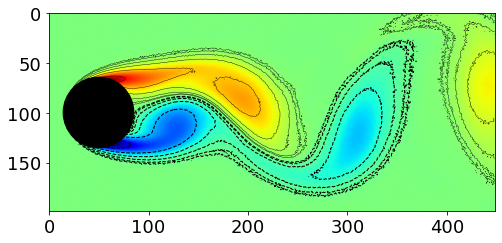

In [13]:
plotFlow(y_pred.T)

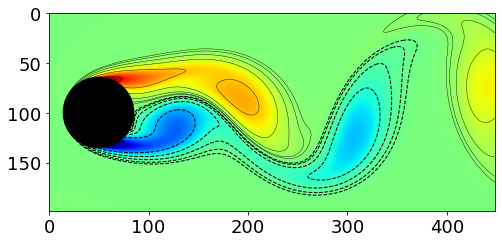

In [15]:
# Plot the 90th shapshot of true movie
plotFlow(X[:,90])

In [16]:
Y_pred=np.zeros((60,89351))
Y_pred[0,:] = model.predict(X_train[89:90,:])
for i in range(59):
    Y_pred[i+1,:]=model.predict(Y_pred[i:i+1,:])

In [17]:
Y_pred.shape

(60, 89351)

In [18]:
# Plot the predicted movie
createMovie_pred(Y_pred.T)

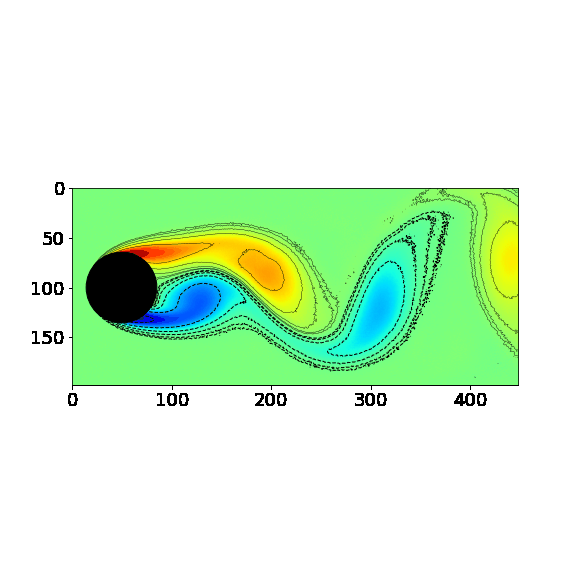

# (iii) RNN

In [19]:
from keras.models import Sequential
from keras.layers import SimpleRNN, Embedding, Dense

In [47]:
sequence_size = 20

rnn_input=np.zeros((X.shape[0],sequence_size, 90-sequence_size))
rnn_output=np.zeros((X.shape[0],90-sequence_size))
rnn_input_test=np.zeros((X.shape[0],sequence_size, 60-sequence_size))

for j in range(70):
    rnn_input[:,:,j]= X[:,j:j+sequence_size]
    rnn_output[:,j]= X[:,j+sequence_size]
    
for k in range(40):
    rnn_input_test[:,:,k]= X[:,70+k:70+k+sequence_size]
 
    
X_train1=rnn_input.T
y_train1=rnn_output.T
X_test1=rnn_input_test.T

In [48]:
X_train1.shape

(70, 20, 89351)

In [49]:
y_train1.shape

(70, 89351)

In [50]:
X_test1.shape

(40, 20, 89351)

In [51]:
model1 = Sequential()
model1.add(SimpleRNN(60, input_shape=(None, X.shape[0])))
model1.add(Dense(X.shape[0]))
model1.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_3 (SimpleRNN)     (None, 60)                5364720   
_________________________________________________________________
dense_9 (Dense)              (None, 89351)             5450411   
Total params: 10,815,131
Trainable params: 10,815,131
Non-trainable params: 0
_________________________________________________________________


In [52]:
model1.compile(loss="mse", optimizer="adam")

In [53]:
history = model1.fit(X_train1, y_train1, epochs=150)

Epoch 1/150
3/3 [==============================] - 5s 668ms/step - loss: 1.2547
Epoch 2/150
3/3 [==============================] - 2s 642ms/step - loss: 1.2064
Epoch 3/150
3/3 [==============================] - 2s 626ms/step - loss: 1.1275
Epoch 4/150
3/3 [==============================] - 2s 647ms/step - loss: 1.0570
Epoch 5/150
3/3 [==============================] - 2s 709ms/step - loss: 0.9938
Epoch 6/150
3/3 [==============================] - 2s 637ms/step - loss: 0.9355
Epoch 7/150
3/3 [==============================] - 2s 617ms/step - loss: 0.8850
Epoch 8/150
3/3 [==============================] - 2s 623ms/step - loss: 0.8426
Epoch 9/150
3/3 [==============================] - 2s 641ms/step - loss: 0.8015
Epoch 10/150
3/3 [==============================] - 2s 631ms/step - loss: 0.7615
Epoch 11/150
3/3 [==============================] - 2s 595ms/step - loss: 0.7273
Epoch 12/150
3/3 [==============================] - 2s 620ms/step - loss: 0.6960
Epoch 13/150
3/3 [===================

3/3 [==============================] - 2s 598ms/step - loss: 0.1008
Epoch 103/150
3/3 [==============================] - 2s 614ms/step - loss: 0.1001
Epoch 104/150
3/3 [==============================] - 2s 609ms/step - loss: 0.0972
Epoch 105/150
3/3 [==============================] - 2s 639ms/step - loss: 0.0970
Epoch 106/150
3/3 [==============================] - 2s 688ms/step - loss: 0.0989
Epoch 107/150
3/3 [==============================] - 2s 618ms/step - loss: 0.0960
Epoch 108/150
3/3 [==============================] - 2s 660ms/step - loss: 0.0964
Epoch 109/150
3/3 [==============================] - 2s 626ms/step - loss: 0.0948
Epoch 110/150
3/3 [==============================] - 2s 602ms/step - loss: 0.0929
Epoch 111/150
3/3 [==============================] - 2s 632ms/step - loss: 0.0938
Epoch 112/150
3/3 [==============================] - 2s 660ms/step - loss: 0.0937
Epoch 113/150
3/3 [==============================] - 2s 618ms/step - loss: 0.1068
Epoch 114/150
3/3 [===========

In [54]:
X_test1[0:1,:,:].shape

(1, 20, 89351)

In [57]:
y_pred90=model1.predict(X_test1[0:1,:,:])

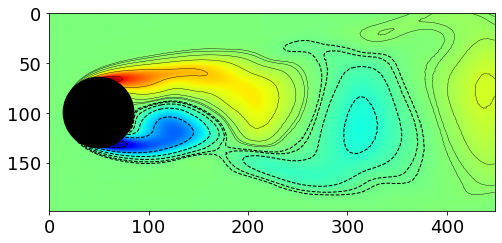

In [58]:
# Plot the 90th snapshot of prediction
plotFlow(y_pred90.T)

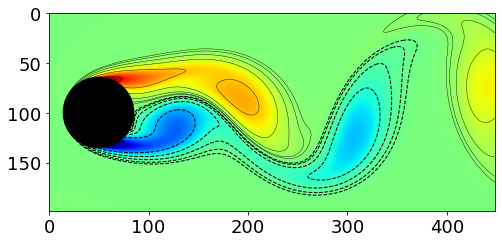

In [59]:
# Plot the 90th shapshot of true movie
plotFlow(X[:,90])

In [62]:
Y_pred_rnn=np.zeros((20,89351))
Y_pred_rnn[0,:] = y_pred90
for i in range(19):
    Y_pred_rnn[i+1,:]=model1.predict(X_test1[i:i+1,:,:])

In [66]:
# Plot the predicted movie (90s-110s)
createMovie_pred_rnn(Y_pred_rnn.T)

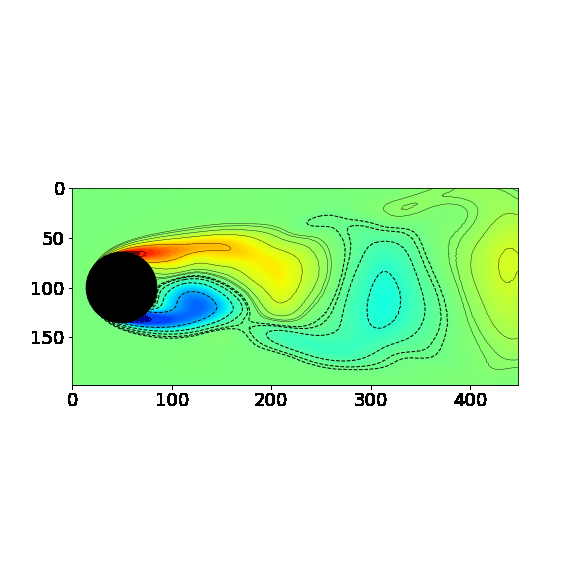